<a href="https://colab.research.google.com/github/Edersao/Atmosf-ricos/blob/main/formatos_tiff.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Librerias que se utilizaran. Vemos si se encuentran dentro de Google Colab o hay que instalarlas

In [1]:
#!pip show osgeo
#!pip show os
#!pip show struct
#!pip show time
#
!pip install -q condacolab
import condacolab
condacolab.install()

✨🍰✨ Everything looks OK!


In [2]:
!mamba install -q gdal=3.4.1

In [1]:
from os import system
import struct
import time
from osgeo import gdal

In [2]:
import os
os.chdir('/content/drive/MyDrive/atmos/atmos_ipynb')
print(os.getcwd())
n=os.listdir('/content/drive/MyDrive/atmos/datos/Ixil/Ixil/datos mensuales/')


/content/drive/MyDrive/atmos/atmos_ipynb


In [3]:
import numpy as np
from scipy.interpolate import griddata
from mpl_toolkits.mplot3d.axes3d import *
from matplotlib import cm
import matplotlib.pyplot as plt
import sys

In [4]:

nameraster='/content/drive/MyDrive/atmos/datos/Datos de elevación del inegi-20231123T160912Z-001/Datos de elevación del inegi/Yucatan_r15m.tif'
#start = time.time()

dataset = gdal.Open(nameraster,gdal.GA_ReadOnly)
#band = dataset.GetRasterBand(1)
#print( "Procesando %s" % nameraster)

#x,y,z = getCoorXYZ(band)



In [5]:
if dataset is None:
  print( 'Could not open ' + nameraster)
  sys.exit(1)

Las dos siguientes lineas hacen lo mismo.

In [6]:
#slp1Array = dataset.GetRasterBand(1).ReadAsArray()
dem = gdal.Open(nameraster)
slp = gdal.DEMProcessing('slope.tif',dem, 'slope',computeEdges= True)

In [7]:
slp3 = slp.GetRasterBand(1).ReadAsArray()
slp3[slp3 <= -20]=np.nan

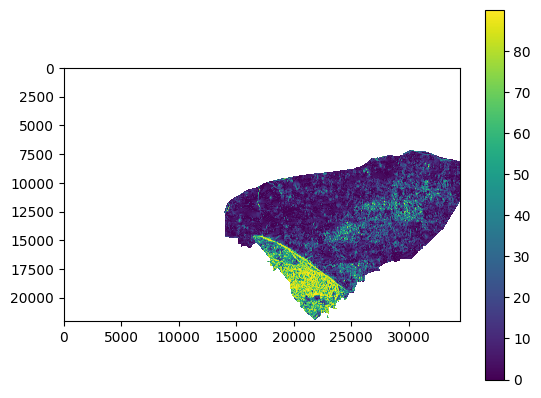

In [14]:
plt.figure()
plt.imshow(slp3)
plt.colorbar()
plt.show()

In [13]:
slp3[slp3 <= -20]=np.nan

la sigueinte función ignorenla, es para hacer un mapa 3D. No lo borro para usarlo después

In [6]:
#Función que conforma los arreglos x,y,z
def getCoorXYZ(band):

    # fmttypes: Byte, UInt16, Int16, UInt32, Int32, Float32 y Float64
    fmttypes = {'Byte':'B', 'UInt16':'H', 'Int16':'h', 'UInt32':'I', 'Int32':'i', 'Float32':'f', 'Float64':'d'}

    print( "filas = %d columnas = %d" % (band.YSize, band.XSize))

    BandType = gdal.GetDataTypeName(band.DataType)

    print( "Tipo de datos = ", BandType)

    totHeight = 0

    x = []
    y_ = []
    z = []

    inc_x = 0

    for y in range(band.YSize):

        scanline = band.ReadRaster(0, y, band.XSize, 1, band.XSize, 1, band.DataType)
        values = struct.unpack(fmttypes[BandType] * band.XSize, scanline)

        for value in values:
            z.append(value)
            inc_x += 1
            y_.append(inc_x)
            x.append(y+1)

        inc_x = 0

    return x, y_, z

lo que sigue es la continuación de la fnción para hacer la imagen 3 D

In [ ]:
# construcción de la grilla 2D
xi = np.linspace(min(x), max(x))
yi = np.linspace(min(y), max(y))
X, Y = np.meshgrid(xi, yi)

# interpolación
Z = griddata(x, y, z, xi, yi)

#Visualización con Matplotlib
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.jet,linewidth=1, antialiased=True)
plt.plot

#end = time.time()

time_tot = end - start

print( "Tiempo total = %.4f s" % time_tot  )

plt.show() #Para que la ventana de visualización permanezca estática

Otro metodo

In [ ]:
import PIL
print(PIL.__file__)

/usr/local/lib/python3.10/dist-packages/PIL/__init__.py


In [ ]:
import PIL.Image
PIL.Image.MAX_IMAGE_PIXELS = 933120000

In [ ]:
from PIL import Image
im = Image.open('/content/drive/MyDrive/atmos/datos/Datos de elevación del inegi-20231123T160912Z-001/Datos de elevación del inegi/Yucatan_r15m.tif')
#im.show()

In [ ]:
imarray = np.array(im)


In [ ]:
imarray.shape

(22051, 34511)

In [ ]:
#Image.fromarray(imarray)